* Author : Harshit Shambharkar
* Roll No: ME21BTECH11019

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import linalg
from mpmath import nsum, exp, inf
%matplotlib inline

In [2]:
# Defining Parameters
alpha = 9.7e-5
T_init = 30
T_1 = 50
T_2 = 150
L = 2 # length
B = 1 # breadth

In [3]:
nx = 21
ny = 21
Tolerance = 1e-4
x = np.linspace(0, L, nx, endpoint=True)
y = np.linspace(0, B, ny, endpoint=True)
dx = y[1] - y[0]
dy = x[1] - x[0]

In [4]:
# to find the maximum permissible time step, as per above set parameters
max_time = 10000
delta_t = 0.5 / (alpha*((1/dx**2) + (1/dy**2)))
print(delta_t)

10.309278350515465


                                        Explicit Method

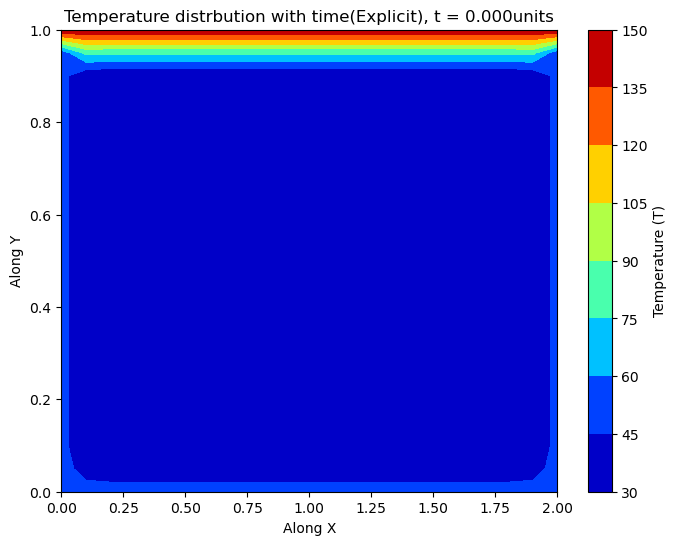

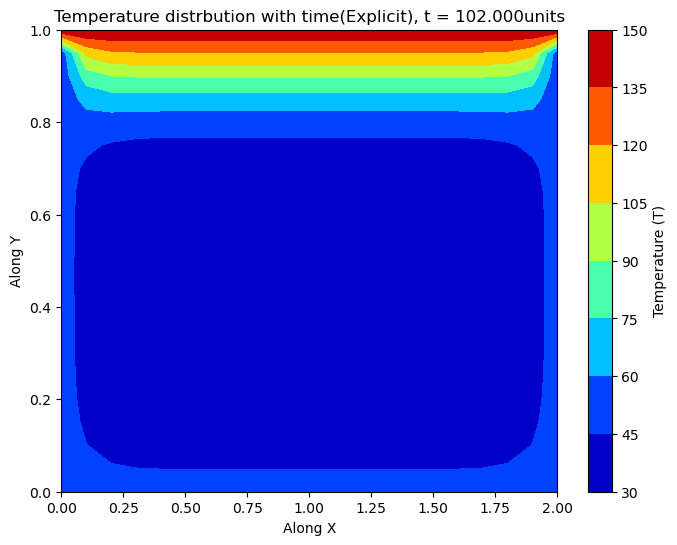

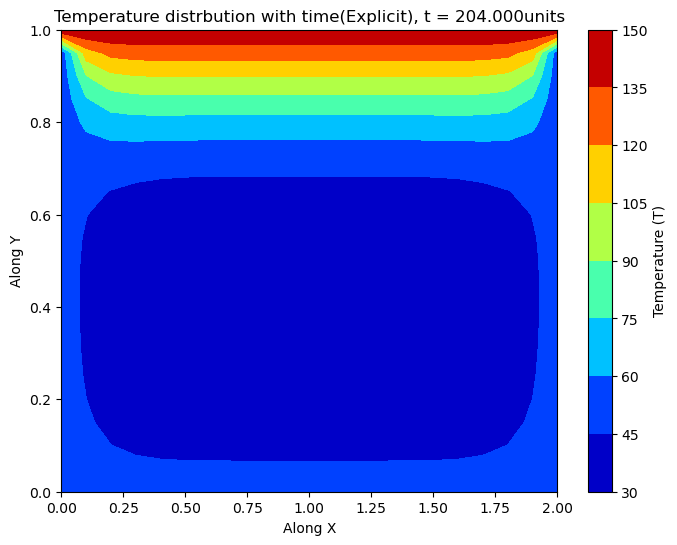

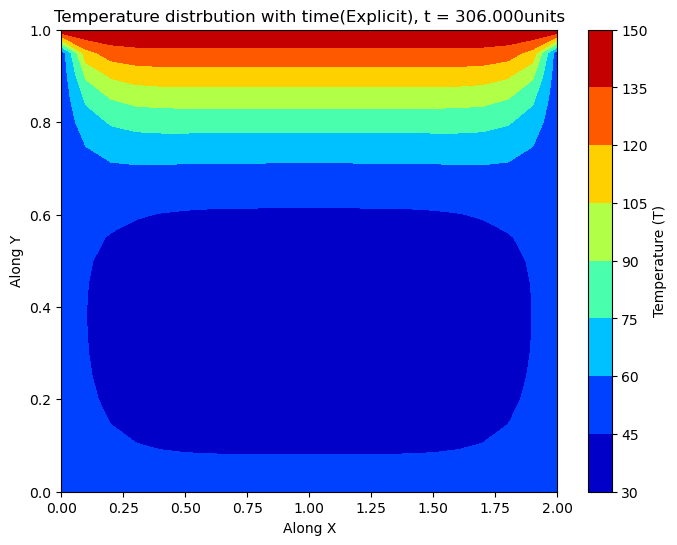

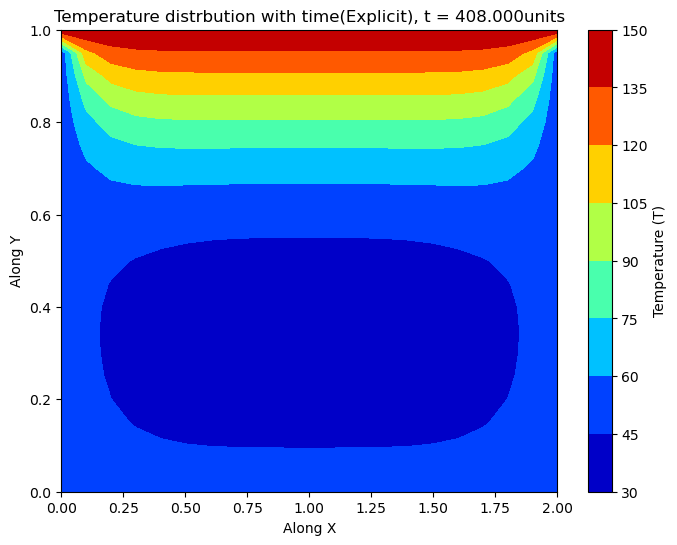

...

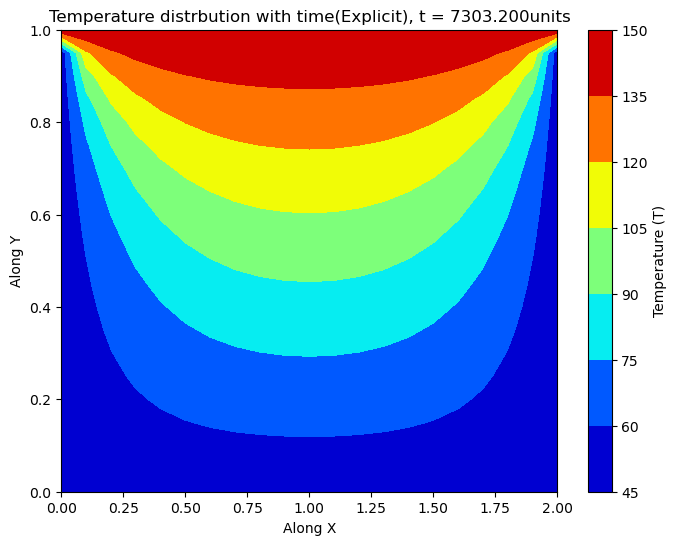

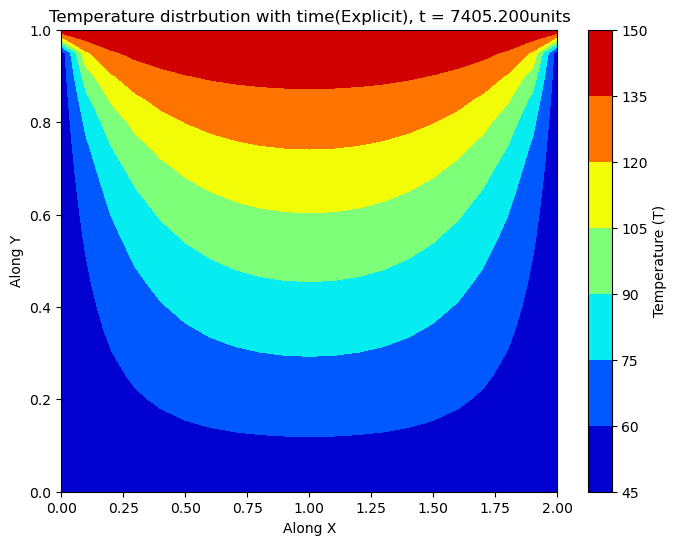

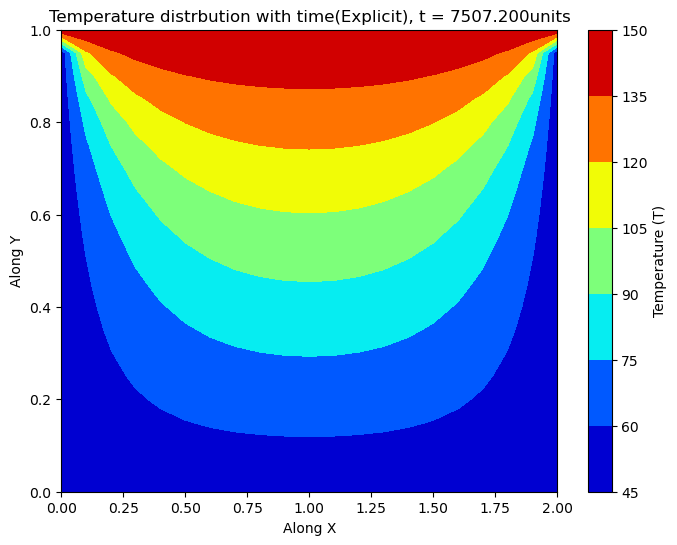

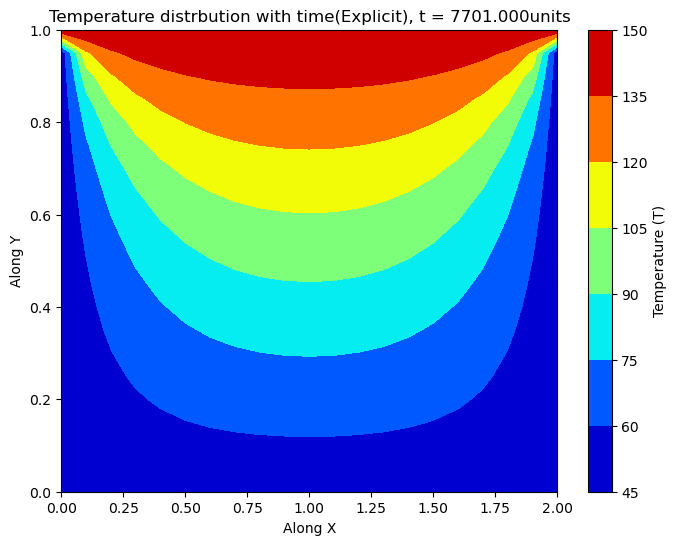

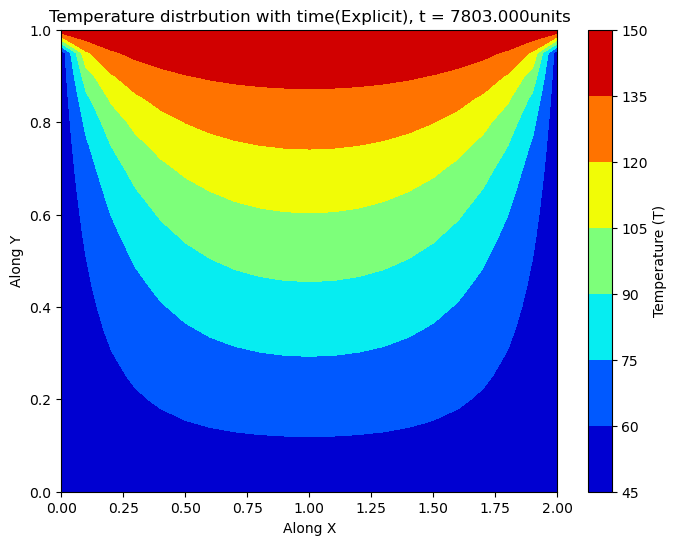

Steady State reached at t = 7813.199999999903 units of time


In [5]:
T_e = np.ones((nx, ny))

#Imposing Initial Conditions
T_e = T_init*T_e

# Initialising Boundary Conditions
T_e[0,:] = T_1
T_e[:,0] = T_1
T_e[:, ny-1] = T_1
T_e[nx-1,:] = T_2


t = 0.0 # time, initially it is 0
dt = 10.2 # time step

rx = alpha*dt/(dx**2)
ry = alpha*dt/(dy**2)

T_e_old = np.copy(T_e)

while t <= max_time:
    
    for i in range(1,nx-1):
        for j in range(1,ny-1):
            T_e[i,j] = rx*(T_e_old[i+1, j] + T_e_old[i-1, j]) + (1 - 2*rx - 2*ry)*T_e_old[i,j] + ry*(T_e_old[i, j+1] + T_e_old[i, j-1])
    
    if(np.max(np.max(np.abs(T_e - T_e_old))) < Tolerance):
        print(f"Steady State reached at t = {t} units of time")
        break
    
    tt = int(t)
    if  0 <= (tt)%100 <= 8:
        # Plot for the Temperature Distribution
        X, Y = np.meshgrid(x, y)
        plt.figure(figsize=(8,6))

        contour = plt.contourf(X, Y, T_e, cmap=plt.cm.jet)
        #plt.contour(X, Y, T_e, levels = 20, cmap = plt.cm.jet)
        plt.colorbar(contour, label='Temperature (T)')
        plt.title(f'Temperature distrbution with time(Explicit), t = {t:.3f}units')
        plt.xlabel("Along X")
        plt.ylabel("Along Y")
        plt.show()
        
    t = t + dt
    T_e_old = np.copy(T_e)


                                            Implicit Method

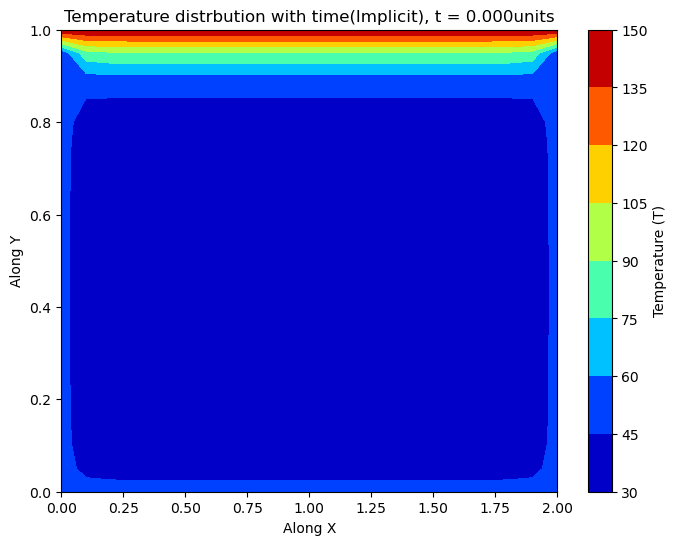

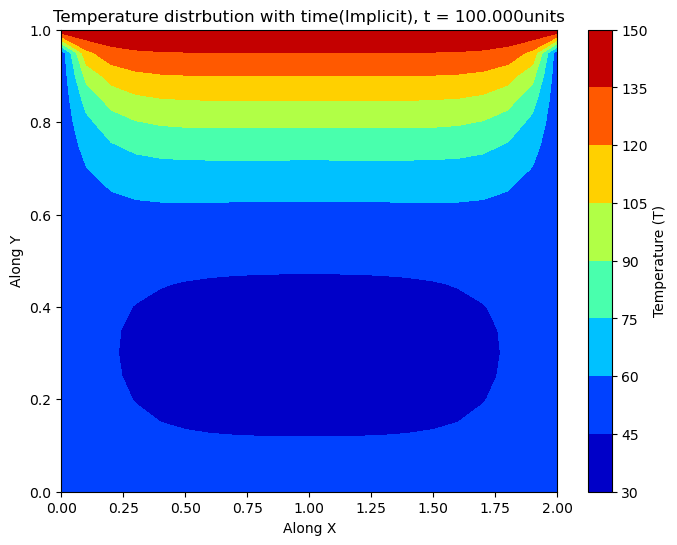

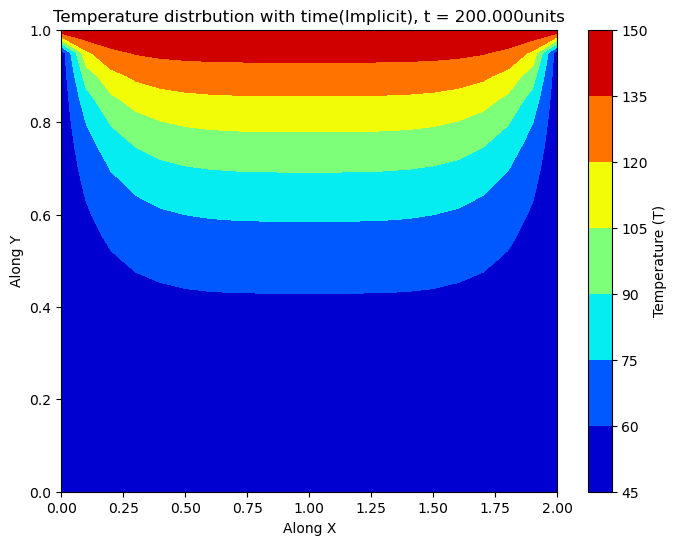

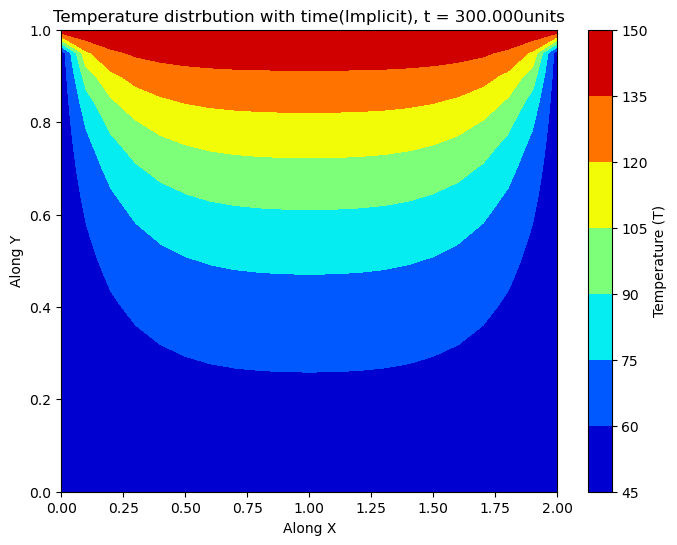

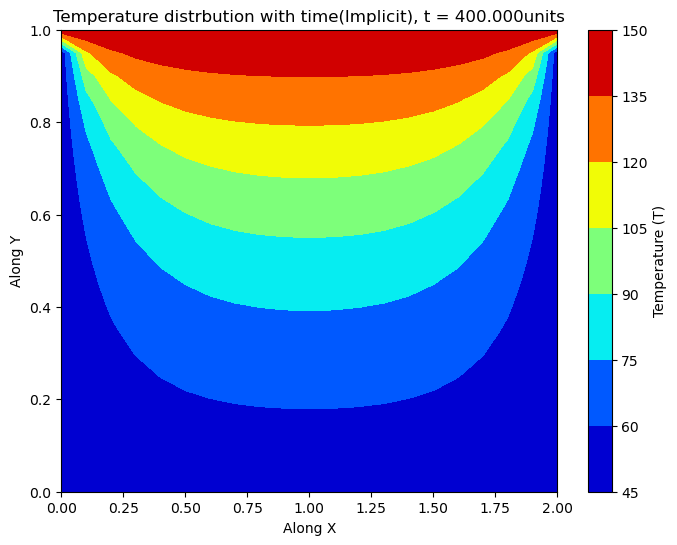

...

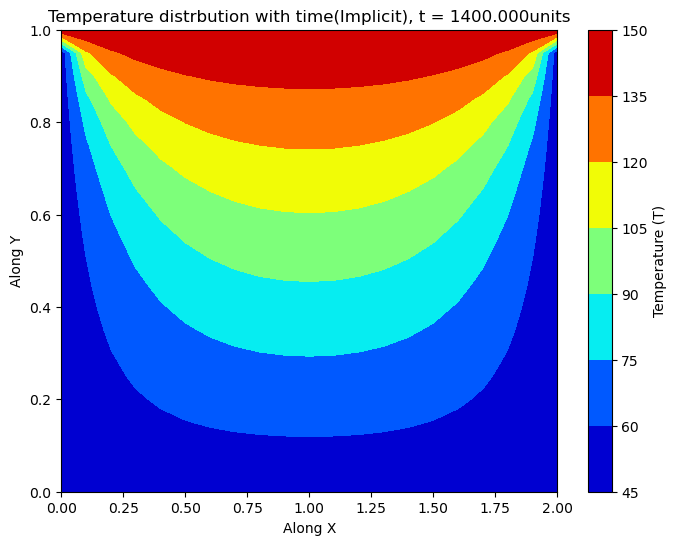

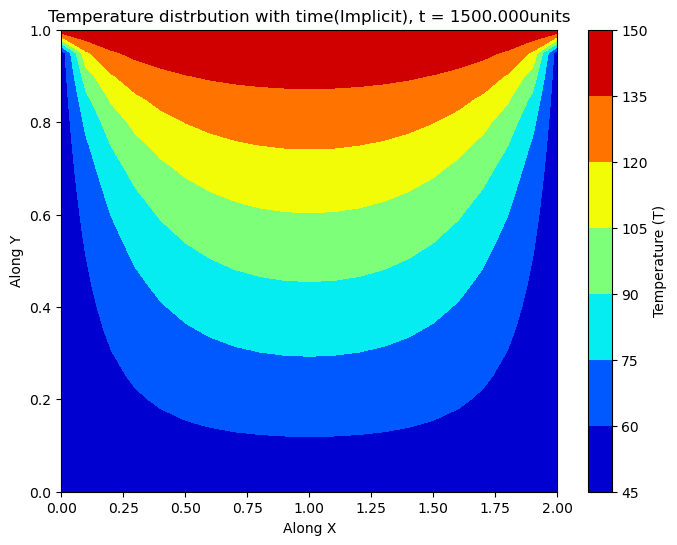

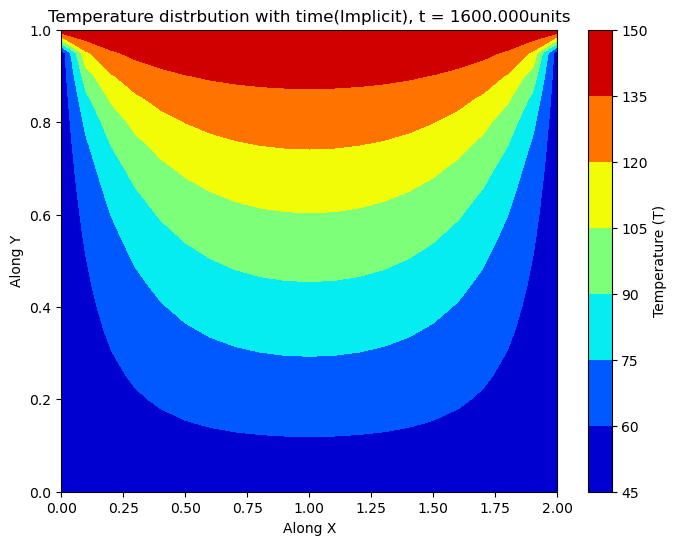

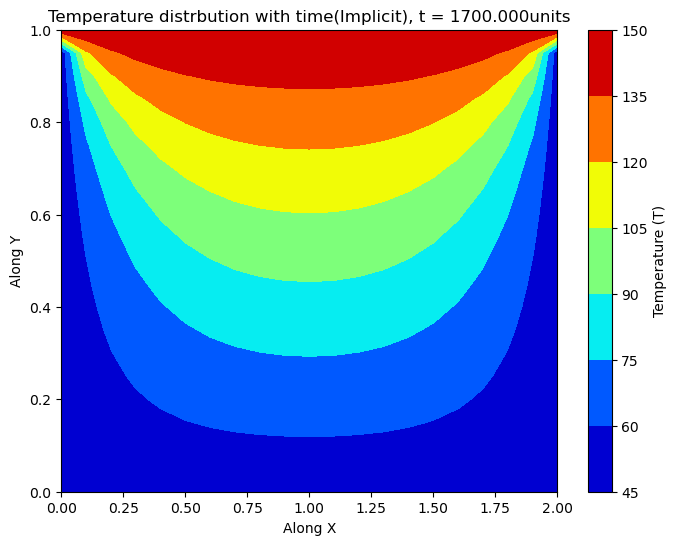

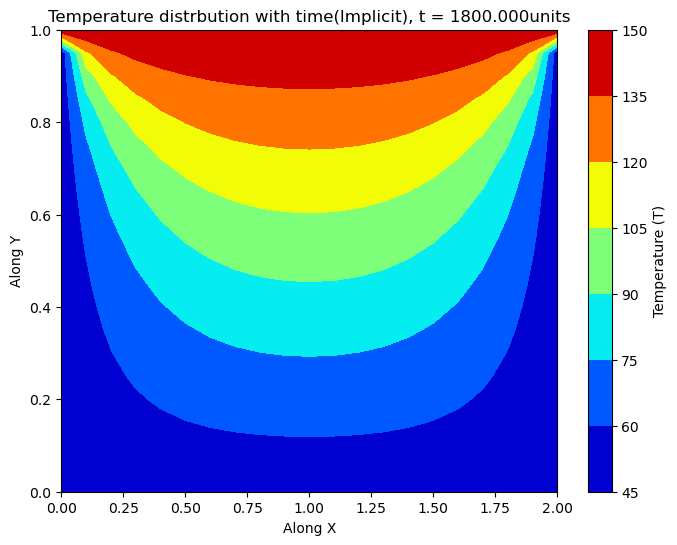

Steady State reached at t, 1880.0 units of time


In [17]:
#Imposing Initial Conditions
t = 0.0 
dt = 10 # Since Impilcit Scheme is Unconditionally Stable, we can use any time step

rx = alpha*dt/(dx**2)
ry = alpha*dt/(dy**2)

T_i = np.ones((nx, ny))
T_i = T_init*T_i


T_i[0,:] = T_1
T_i[:,0] = T_1
T_i[:, ny-1] = T_1
T_i[nx-1,:] = T_2
    
T_i_old = np.copy(T_i)
T_prev = np.copy(T_i)

while t <= max_time:

    Error = 1
    while Error > Tolerance:
        for i in range(1,nx-1):
            for j in range(1, ny-1):
                T_i[i, j] = (T_prev[i,j] + rx*(T_i[i-1, j] + T_i[i+1, j]) + ry*(T_i[i, j-1] + T_i[i, j+1]))/ (1 + 2*rx + 2*ry)
        

        Error = np.max(np.max(np.abs(T_i - T_i_old)))
        T_i_old = np.copy(T_i)
    
    if(np.max(np.max(np.abs(T_i - T_prev))) < Tolerance):
        print(f"Steady State reached at t, {t} units of time")
        break
        
        
    tt = int(t)
    if  0 <= (tt)%100 <= 8:
        # Plot for the Temperature Distribution
        X, Y = np.meshgrid(x, y)
        plt.figure(figsize=(8,6))

        contour = plt.contourf(X, Y, T_i, cmap=plt.cm.jet)
        #plt.contour(X, Y, T_e, levels = 20, cmap = plt.cm.jet)
        plt.colorbar(contour, label='Temperature (T)')
        plt.title(f'Temperature distrbution with time(Implicit), t = {t:.3f}units')
        plt.xlabel("Along X")
        plt.ylabel("Along Y")
        plt.show()
    T_prev = np.copy(T_i)
    t = t + dt

In [8]:
# TDMA function is defined, will be used for solving tridiagonal system
def Thomas_algo(a, b, c, d, T0, Tn, n):
    T_tdma = np.zeros(n)
    T_tdma[0] = T0
    T_tdma[n-1] = Tn
    
    T_tdma_old = np.copy(T_tdma)
    
    P = np.zeros(n)
    Q = np.zeros(n)

    P[0] = 0
    Q[0] = T0

    for i in range(1,n):
        P[i] = b / (a - c*P[i-1])
        Q[i] = (d[i] + c*Q[i-1]) / (a - c*P[i-1])

    Q[n-1] = T_tdma[n-1]

    for i in range(n-2,-1, -1):
        T_tdma[i] = T_tdma[i+1]*P[i] + Q[i]
    
    return T_tdma


                                        Alternate  Direction  Implicit

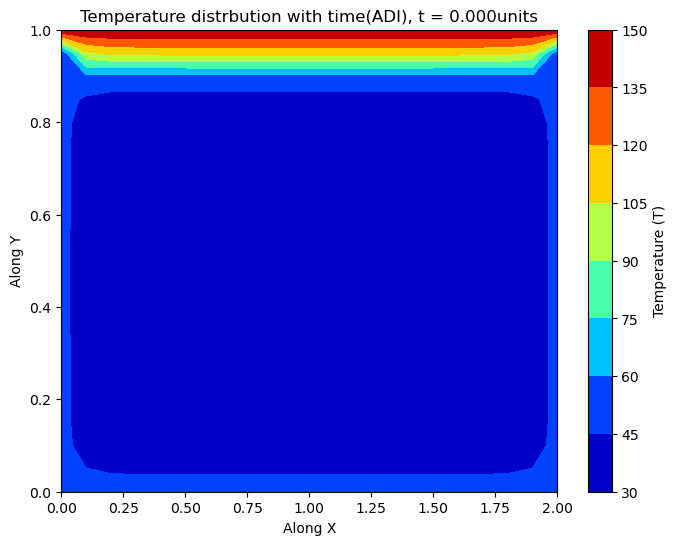

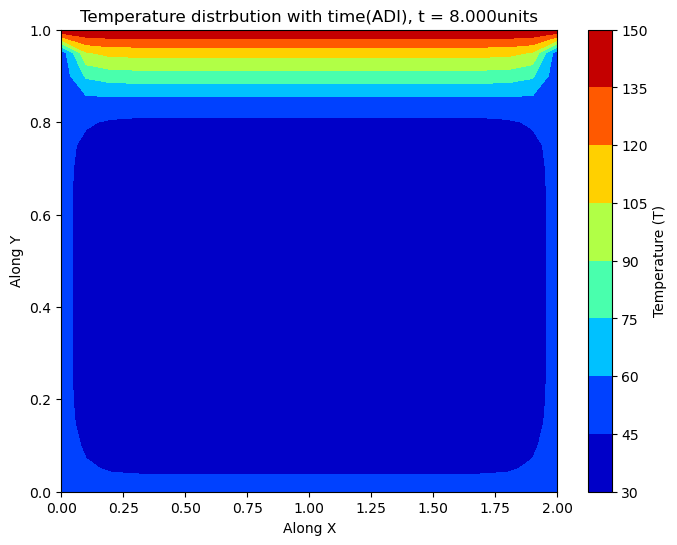

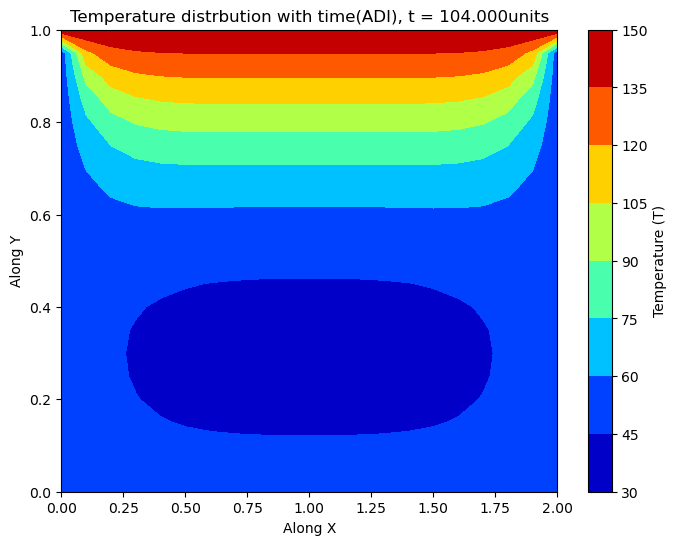

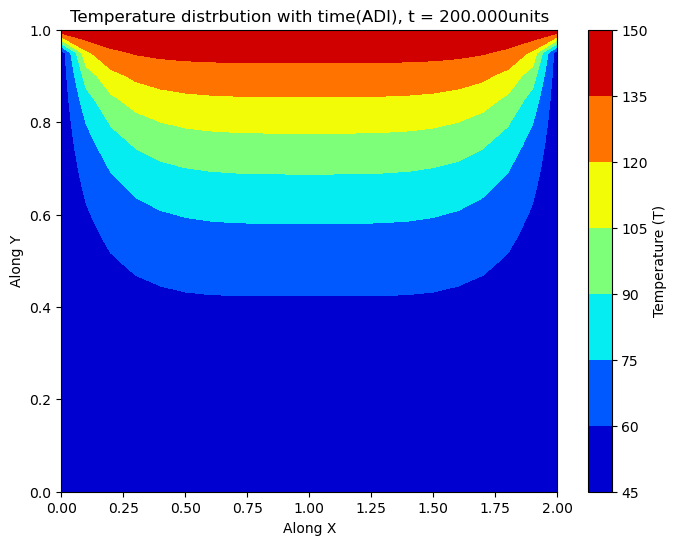

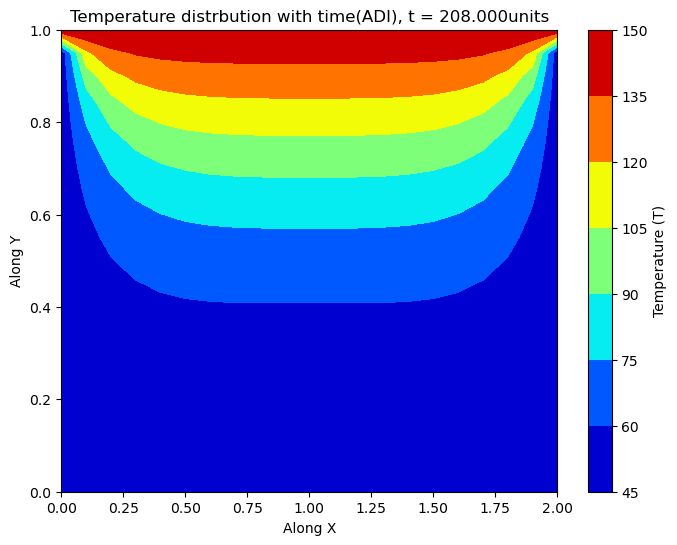

...

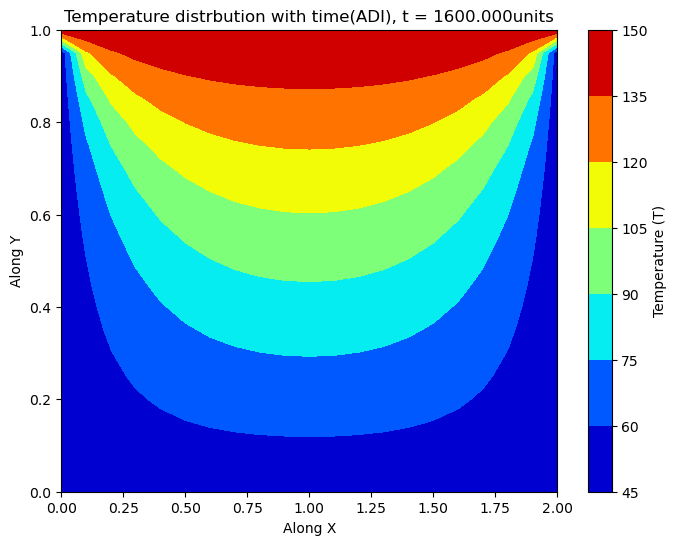

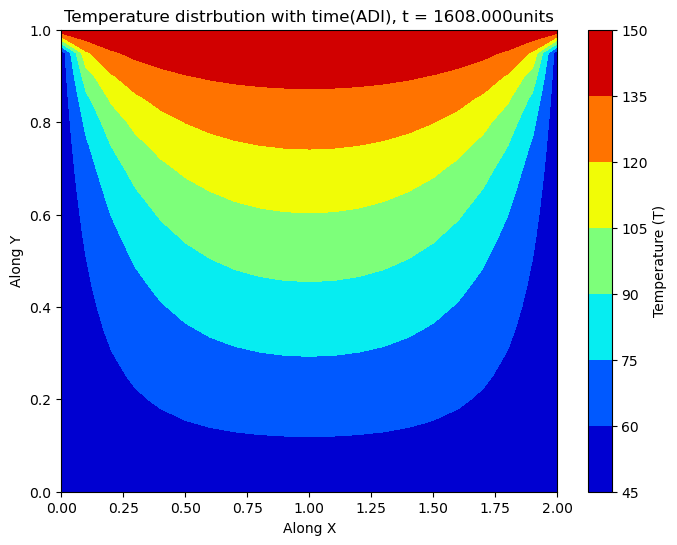

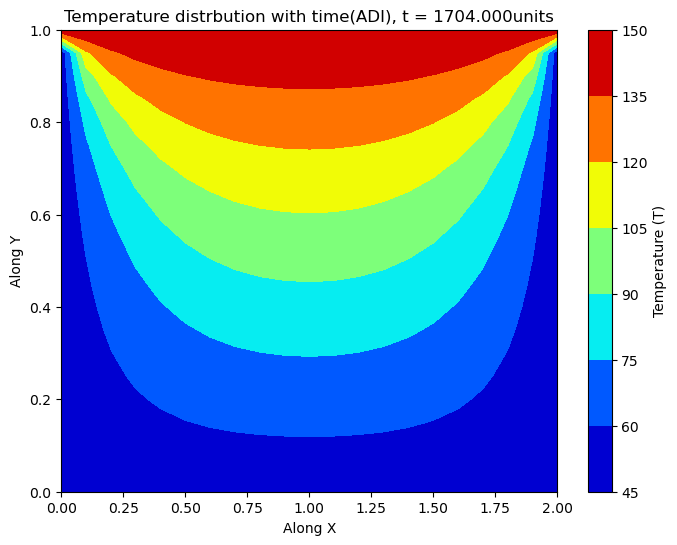

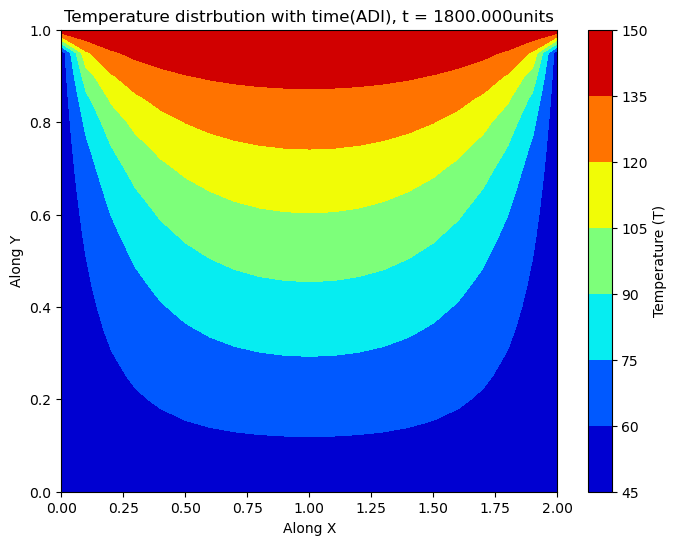

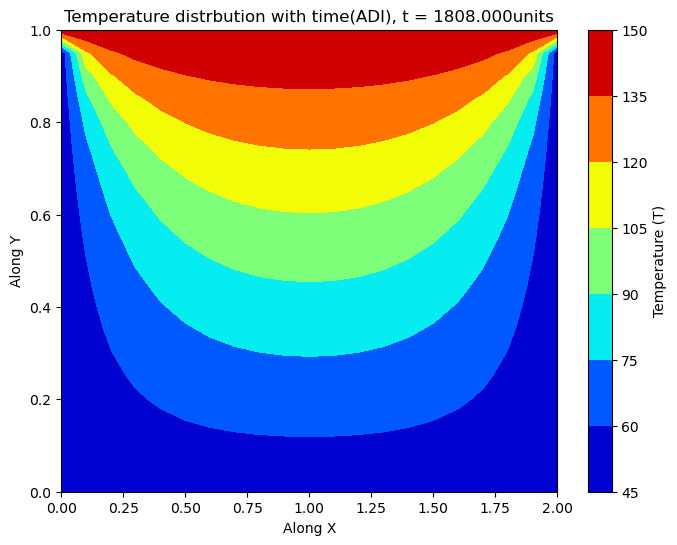

Steady State reached at t, 1856.0 units of time


In [18]:
t = 0.0
dt = 8

rx = alpha*dt/(dx**2)
ry = alpha*dt/(dy**2)

T_adt = np.ones((nx, ny))

T_adt = T_init*T_adt

T_adt[0,:] = T_1
T_adt[:,0] = T_1
T_adt[:, ny-1] = T_1
T_adt[nx-1,:] = T_2

T_adt_old = np.copy(T_adt)
    
while t <= max_time:
    
    Temp = np.copy(T_adt_old)
    
    # Sweeping in X - Direction
    a = (1 + ry)
    b = 0.5*ry
    c = 0.5*ry  
  
    T0 = T_1
    Tn = T_1
    for i in range(1,nx-1):
        d = np.zeros(ny)
        for j in range(1, ny-1):
            d[j] = 0.5*rx*T_adt_old[i-1,j] + (1 - rx)*T_adt_old[i,j] + 0.5*rx*T_adt_old[i+1,j]
            
        Temp[i,:] = Thomas_algo(a,b,c,d, T0, Tn,ny)
    
    T_adt = np.copy(Temp)
    # Sweeping in Y Direction

    a = 1 + rx
    b = 0.5*rx
    c = 0.5*rx

    T0 = T_1
    Tn = T_2
    for j in range(1, ny-1):
        d = np.zeros(nx)
        for i in range(1, nx-1):
            d[i] = 0.5*ry*Temp[i,j-1] + (1 - ry)*Temp[i,j] + 0.5*ry*Temp[i,j+1]
        
        T_adt[:,j] = Thomas_algo(a,b,c,d,T0,Tn,nx)
        
    if(np.max(np.max(np.abs(T_adt - T_adt_old))) < Tolerance):
        print(f"Steady State reached at t, {t} units of time")
        break
          
    tt = int(t)
    if  0 <= (tt)%100 <= 8:
        # Plot for the Temperature Distribution
        X, Y = np.meshgrid(x, y)
        plt.figure(figsize=(8,6))

        contour = plt.contourf(X, Y, T_adt, cmap=plt.cm.jet)
        #plt.contour(X, Y, T_e, levels = 20, cmap = plt.cm.jet)
        plt.colorbar(contour, label='Temperature (T)')
        plt.title(f'Temperature distrbution with time(ADI), t = {t:.3f}units')
        plt.xlabel("Along X")
        plt.ylabel("Along Y")
        plt.show()
    
    t = t + dt
    T_adt_old = np.copy(T_adt)


                                        Cranck Nickolson Method

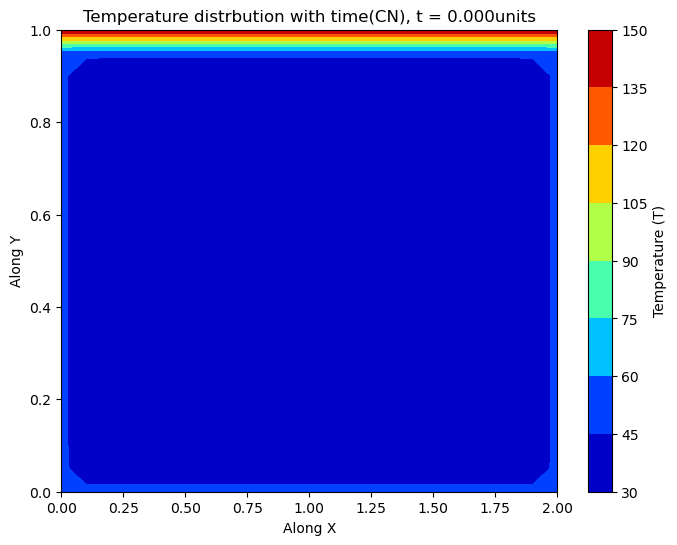

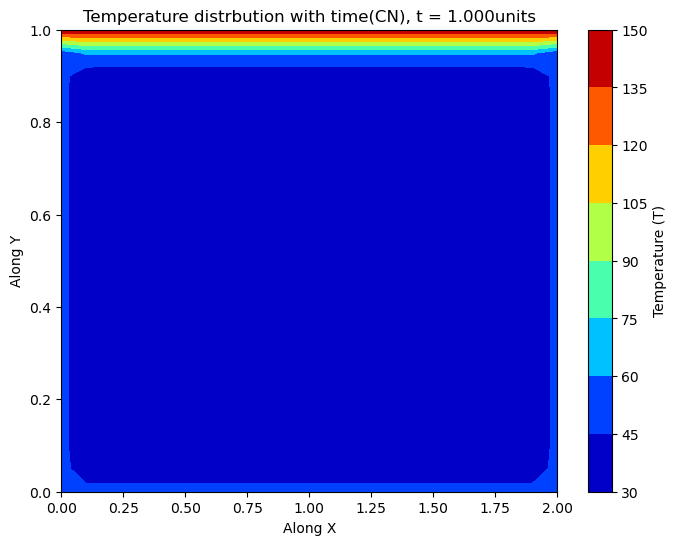

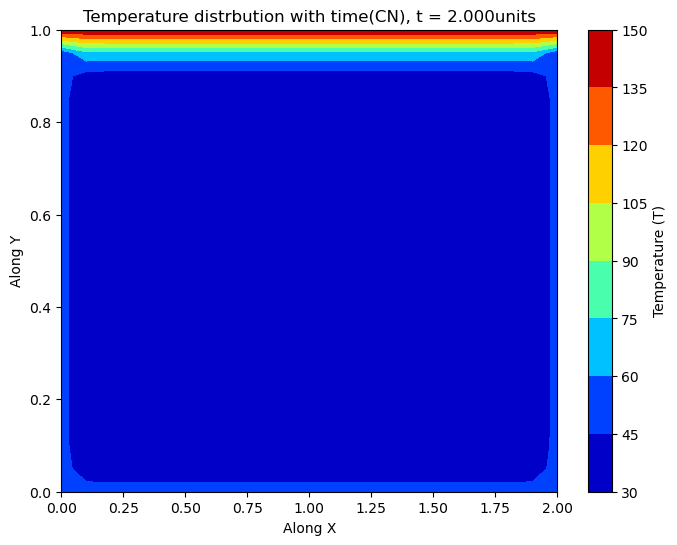

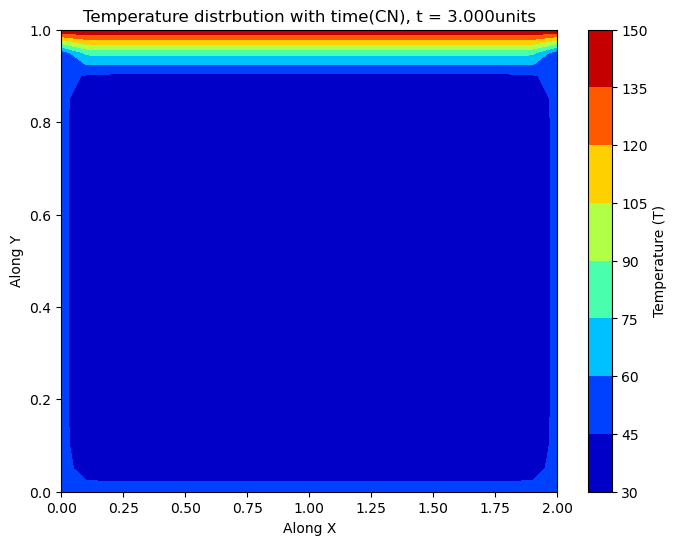

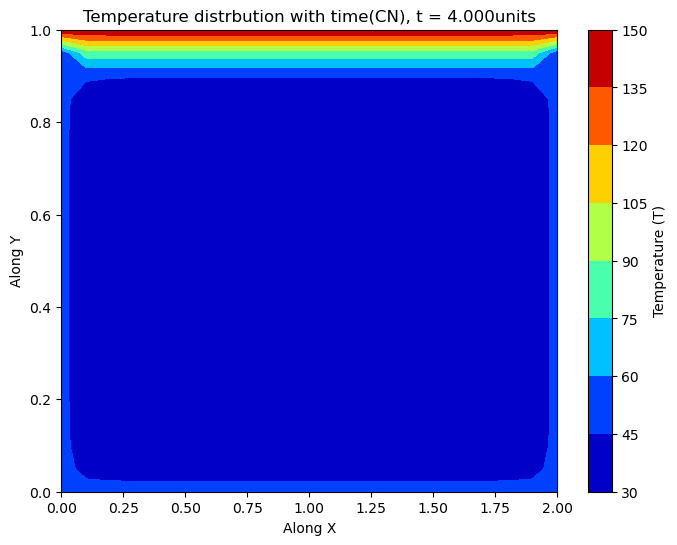

...

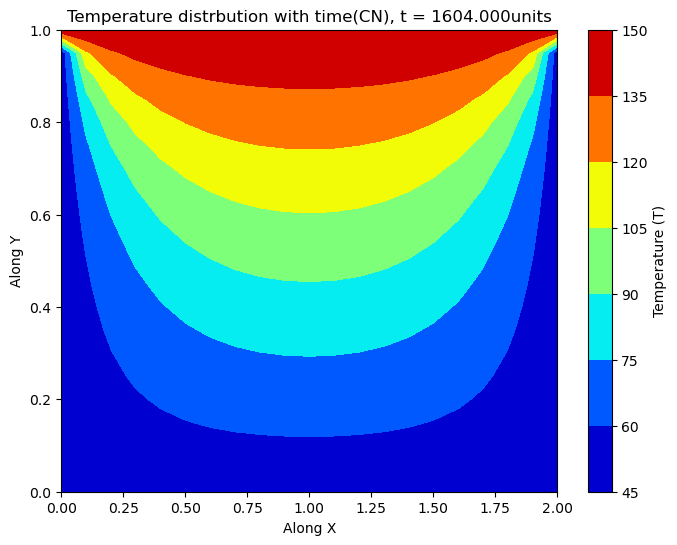

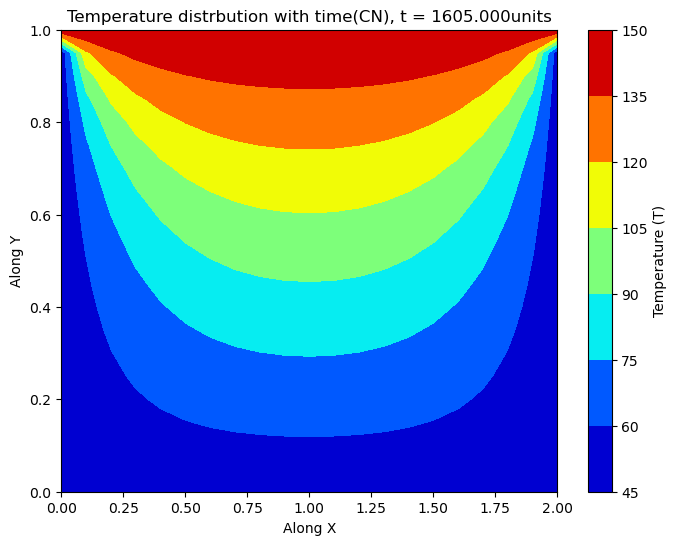

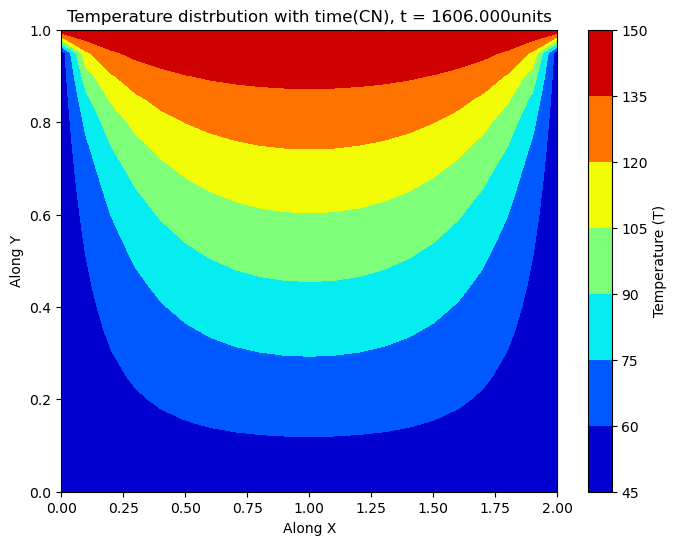

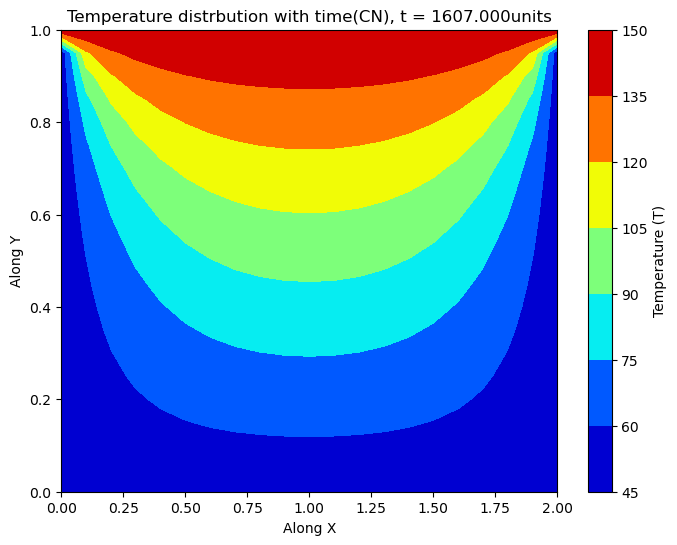

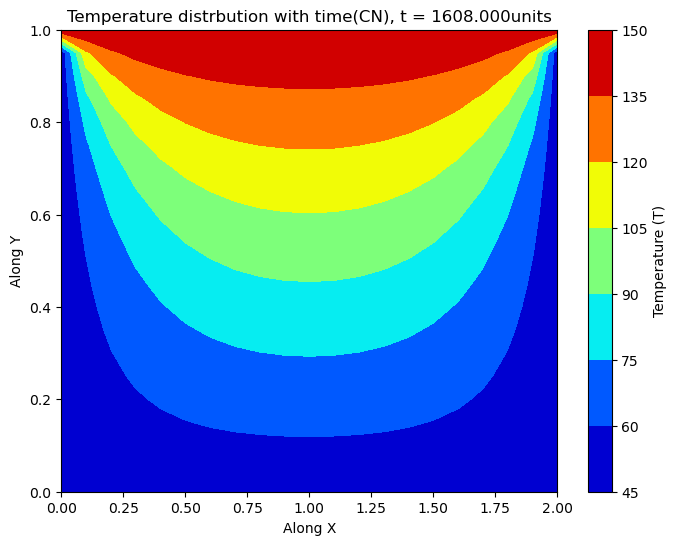

Steady State reached at t, 1616.0 units of time


In [19]:
T_CN = np.ones((nx, ny))

t = 0.0
dt = 1.0

rx = alpha*dt/(dx**2)
ry = alpha*dt/(dy**2)

T_CN = T_CN*T_init

T_CN[0,:] = T_1
T_CN[:,0] = T_1
T_CN[:, ny-1] = T_1
T_CN[nx-1,:] = T_2

T_CN_old = np.copy(T_CN)

while t <= max_time:
    a = (1 + ry + rx)
    b = 0.5*ry
    c = 0.5*ry
    T0 = T_1
    Tn = T_1
    
    for i in range(1,nx-1):
        d = np.zeros(ny)
        for j in range(1,ny-1):
            term1 = 0.5*rx*(T_CN_old[i-1,j] - 2*T_CN_old[i, j] + T_CN_old[i+1,j]) 
            term2 = 0.5*ry*(T_CN_old[i,j-1] - 2*T_CN_old[i, j] + T_CN_old[i,j+1])
            term3 = 0.5*rx*(T_CN[i-1,j] + T_CN[i+1, j])
            d[j] = term1 + term2 + term3 + T_CN_old[i,j]
                      
            
        T_CN[i,:] = Thomas_algo(a,b,c,d,T0,Tn,ny) 
        
        
    if(np.max(np.max(np.abs(T_CN - T_CN_old))) < Tolerance):
        print(f"Steady State reached at t, {t} units of time")
        break
        
    tt = t
    if  0 <= int(tt)%100 <= 8:
        # Plot for the Temperature Distribution
        X, Y = np.meshgrid(x, y)
        plt.figure(figsize=(8,6))

        contour = plt.contourf(X, Y, T_CN, cmap=plt.cm.jet)
        #plt.contour(X, Y, T_e, levels = 20, cmap = plt.cm.jet)
        plt.colorbar(contour, label='Temperature (T)')
        plt.title(f'Temperature distrbution with time(CN), t = {tt:.3f}units')
        plt.xlabel("Along X")
        plt.ylabel("Along Y")
        plt.show()
    t = t + dt
    T_CN_old = np.copy(T_CN)


In [11]:
# #Analytical Solution
# T_analytical = np.zeros((nx,ny))
# for i in range(nx):
#     for j in range(ny):
#             f = nsum(lambda k : ((-1**(k+1) + 1)/k)*np.sin(k*np.pi*(j+1)/L)*np.sinh(k*np.pi*(i+1)/L) / (np.sinh(k*np.pi/L)), [1,inf])

#             T_analytical[i,j] = c*f + T_1
        
# X, Y = np.meshgrid(x, y)
# plt.figure(figsize=(8,6))
# contour = plt.contourf(X, Y, T_analytical, cmap=plt.cm.jet)
# # plt.contour(X, Y, T_e, levels = 20, cmap = plt.cm.jet)
# plt.colorbar(contour, label='Temperature (T)')
# plt.title('Temperature distrbution with time(Cranck Nickolson Method)')
# plt.xlabel("Along X")
# plt.ylabel("Along Y")
# plt.show()

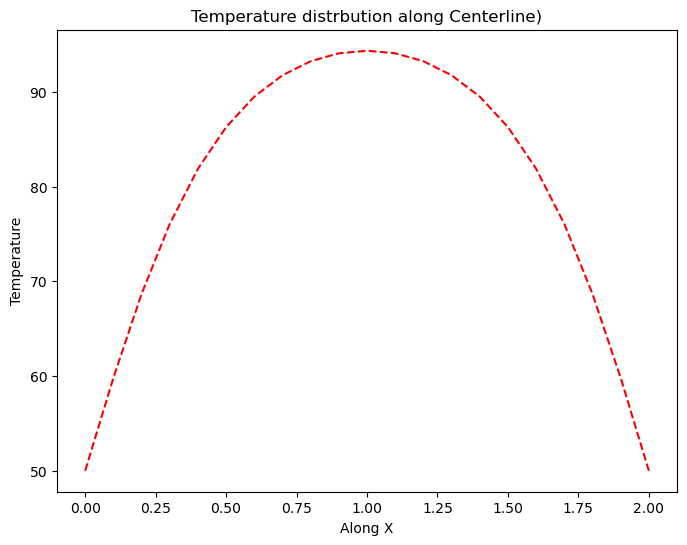

In [12]:
T_mid_x = T_CN[nx//2, :]
T_mid_y = T_CN[:, ny//2]

X, Y = np.meshgrid(x, y)
plt.figure(figsize=(8,6))
plt.plot(x, T_mid_x,'r--')
plt.title('Temperature distrbution along Centerline)')
plt.xlabel("Along X")
plt.ylabel("Temperature")
plt.show()

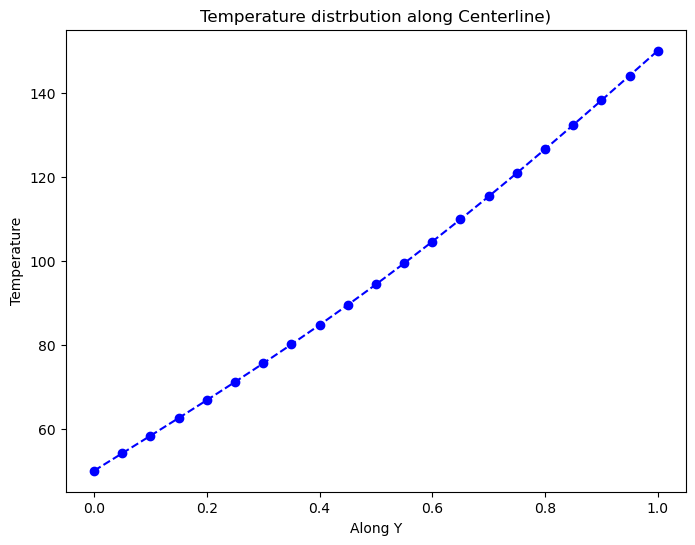

In [13]:
T_mid_x = T_CN[nx//2, :]
T_mid_y = T_CN[:, ny//2]

X, Y = np.meshgrid(x, y)
plt.figure(figsize=(8,6))
plt.plot(y, T_mid_y,'b--o')
plt.title('Temperature distrbution along Centerline)')
plt.xlabel("Along Y")
plt.ylabel("Temperature")
plt.show()

                                    Grid Independence Test

Steady State reached at t, 7840.0 units of time
Steady State reached at t, 7770.0 units of time
Steady State reached at t, 7710.0 units of time
Steady State reached at t, 7630.0 units of time
Steady State reached at t, 7580.0 units of time


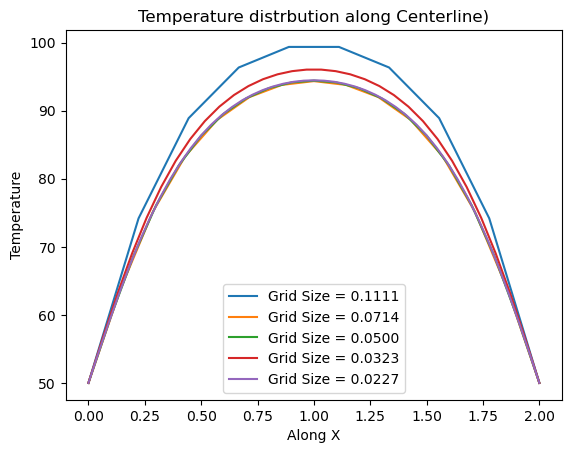

In [16]:
def implicit(n,dx,dy):
   #Imposing Initial Conditions
    t = 0.0 
    nx= ny = n
    dt = 10 # Since Impilcit Scheme is Unconditionally Stable, we can use any time step

    rx = alpha*dt/(dx**2)
    ry = alpha*dt/(dy**2)

    T_i = np.ones((nx, ny))
    T_i = T_init*T_i


    T_i[0,:] = T_1
    T_i[:,0] = T_1
    T_i[:, ny-1] = T_1
    T_i[nx-1,:] = T_2

    T_i_old = np.copy(T_i)
    T_prev = np.copy(T_i)

    while t <= max_time:

        Error = 1
        while Error > Tolerance:
            for i in range(1,nx-1):
                for j in range(1, ny-1):
                    T_i[i, j] = (T_prev[i,j] + rx*(T_i[i-1, j] + T_i[i+1, j]) + ry*(T_i[i, j-1] + T_i[i, j+1]))/ (1 + 2*rx + 2*ry)


            Error = np.max(np.max(np.abs(T_i - T_i_old)))
            T_i_old = np.copy(T_i)

        if(np.max(np.max(np.abs(T_i - T_prev))) < Tolerance):
            print(f"Steady State reached at t, {t} units of time")
            break


#         tt = int(t)
#         if  0 <= (tt)%100 <= 8:
#             # Plot for the Temperature Distribution
#             X, Y = np.meshgrid(x, y)
#             plt.figure(figsize=(8,6))

#             contour = plt.contourf(X, Y, T_i, cmap=plt.cm.jet)
#             #plt.contour(X, Y, T_e, levels = 20, cmap = plt.cm.jet)
#             plt.colorbar(contour, label='Temperature (T)')
#             plt.title(f'Temperature distrbution with time(Implicit), t = {t:.3f}units')
#             plt.xlabel("Along X")
#             plt.ylabel("Along Y")
#             plt.show()
        T_prev = np.copy(T_i)
        t = t + dt
        
    return T_i
    
    

grid_points = [10, 15, 21, 32, 45]

for g in grid_points:
    
    x_t = np.linspace(0,L,g,endpoint=True)
    y_t = np.linspace(0,B,g,endpoint=True)
    dx = y_t[1] - y_t[0]
    dy = x_t[1] - x_t[0]
    T = implicit(g,dx,dy)
    T_plot = T[g//2,:]
    
    plt.plot(x_t, T_plot,label=f'Grid Size = {dx:.4f}')
    plt.title('Temperature distrbution along Centerline)')
    plt.xlabel("Along X")
    plt.ylabel("Temperature")
    plt.legend()
    plt.show()

Steady State reached at t, 7840.0 units of time
Steady State reached at t, 7770.0 units of time
Steady State reached at t, 7710.0 units of time
Steady State reached at t, 7630.0 units of time
Steady State reached at t, 7580.0 units of time


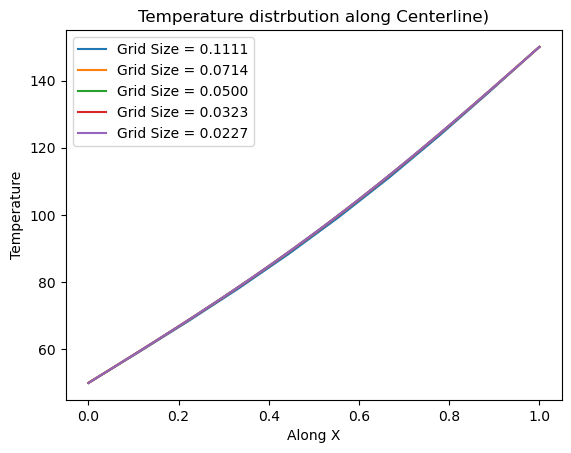

In [22]:
grid_points = [10, 15, 21, 32, 45]

for g in grid_points:
    
    x_t = np.linspace(0,L,g,endpoint=True)
    y_t = np.linspace(0,B,g,endpoint=True)
    dx = y_t[1] - y_t[0]
    dy = x_t[1] - x_t[0]
    T = implicit(g,dx,dy)
    T_plot = T[:,g//2]
    
    plt.plot(y_t, T_plot,label=f'Grid Size = {dx:.4f}')
plt.title('Temperature distrbution along Centerline)')
plt.xlabel("Along X")
plt.ylabel("Temperature")
plt.legend()
plt.show()